In [1]:
import os
import pandas as pd
import cv2
import torch
import torch.nn.utils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.model_selection import train_test_split
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [2]:
# Ruta al dataset
data_dir = "/Dataset/"
images_train_dir = os.path.join(data_dir, "train/images/")
masks_train_dir = os.path.join(data_dir, "train/masks/lanes/")
images_val_dir = os.path.join(data_dir, "val/images/")
masks_val_dir = os.path.join(data_dir, "val/masks/lanes/")

# Crear listas de datos para entrenamiento y validación
def prepare_data(images_dir, masks_dir):
    images = sorted(os.listdir(images_dir))
    masks = sorted(os.listdir(masks_dir))
    data = []

    for img, mask in zip(images, masks):
        if img.split('.')[0] == mask.split('_')[0]:  # Asegurarse de emparejar correctamente
            data.append({
                "image": os.path.join(images_dir, img),
                "annotation": os.path.join(masks_dir, mask)
            })
    return data

# Datos de entrenamiento y validación
train_data = prepare_data(images_train_dir, masks_train_dir)
val_data = prepare_data(images_val_dir, masks_val_dir)

# Verificar tamaño de los conjuntos
print(f"Total imágenes de entrenamiento: {len(train_data)}")
print(f"Total imágenes de validación: {len(val_data)}")

Total imágenes de entrenamiento: 32
Total imágenes de validación: 8


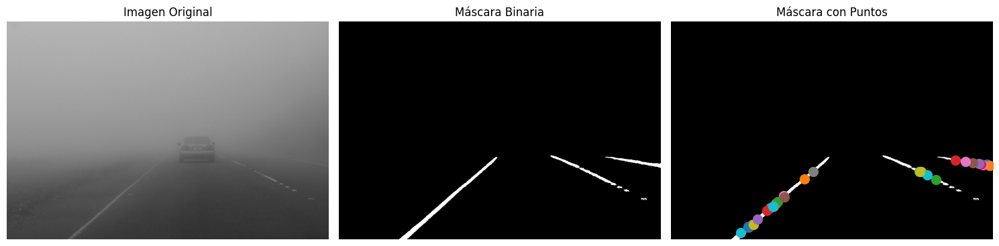

In [4]:
def read_batch(data, visualize_data=False):
    # Seleccionar una entrada aleatoria
    ent = data[np.random.randint(len(data))]

    # Cargar las rutas completas
    img = cv2.imread(ent["image"])[..., ::-1]  # Convertir BGR a RGB
    ann_map = cv2.imread(ent["annotation"], cv2.IMREAD_GRAYSCALE)  # Leer máscara como escala de grises

    if img is None or ann_map is None:
        print(f"Error: No se pudo leer la imagen o máscara en {ent['image']} o {ent['annotation']}")
        return None, None, None, 0

    # Redimensionar imagen y máscara
    r = np.min([1024 / img.shape[1], 1024 / img.shape[0]])  # Factor de escala
    img = cv2.resize(img, (int(img.shape[1] * r), int(img.shape[0] * r)))
    ann_map = cv2.resize(ann_map, (int(ann_map.shape[1] * r), int(ann_map.shape[0] * r)), interpolation=cv2.INTER_NEAREST)

    # Crear máscara binaria para la clase de carros
    binary_mask = (ann_map > 0).astype(np.uint8)  # Convertir todas las regiones de carros en 1

    # Erosionar la máscara binaria para evitar puntos en los bordes
    eroded_mask = cv2.erode(binary_mask, np.ones((5, 5), np.uint8), iterations=1)

    # Obtener todas las coordenadas dentro de la máscara erosionada
    coords = np.argwhere(eroded_mask > 0)

    points = []
    if len(coords) > 0:
        # Seleccionar hasta 10 puntos únicos
        num_points = min(30, len(coords))
        selected_indices = np.random.choice(len(coords), num_points, replace=False)
        points = [[yx[1], yx[0]] for yx in coords[selected_indices]]  # Invertir coordenadas para formato x, y

    points = np.array(points)

    if visualize_data:
        # Graficar la imagen y los puntos
        plt.figure(figsize=(15, 5))

        # Imagen Original
        plt.subplot(1, 3, 1)
        plt.title('Imagen Original')
        plt.imshow(img)
        plt.axis('off')

        # Máscara binaria
        plt.subplot(1, 3, 2)
        plt.title('Máscara Binaria')
        plt.imshow(binary_mask, cmap='gray')
        plt.axis('off')

        # Máscara con puntos
        plt.subplot(1, 3, 3)
        plt.title('Máscara con Puntos')
        plt.imshow(binary_mask, cmap='gray')

        # Dibujar puntos
        colors = list(mcolors.TABLEAU_COLORS.values())
        for i, point in enumerate(points):
            plt.scatter(point[0], point[1], c=colors[i % len(colors)], s=100, label=f'Punto {i+1}')

        plt.axis('off')
        plt.tight_layout()
        plt.show()

    binary_mask = np.expand_dims(binary_mask, axis=-1)  # Convertir a forma (alto, ancho, 1)
    binary_mask = binary_mask.transpose((2, 0, 1))  # Convertir a (canales, alto, ancho)
    points = np.expand_dims(points, axis=1)  # Expandir dimensión de puntos

    # Retornar la imagen, máscara binaria, puntos y el número de máscaras detectadas
    return img, binary_mask, points, 1  # Solo hay una clase (carros)

# Visualizar los datos
Img1, masks1, points1, num_masks = read_batch(train_data, visualize_data=True)

In [5]:
sam2_checkpoint = "/sam2/checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device='cpu')
predictor = SAM2ImagePredictor(sam2_model)

In [7]:
# Train mask decoder.
predictor.model.sam_mask_decoder.train(True)

# Train prompt encoder.
predictor.model.sam_prompt_encoder.train(True)

# Configure optimizer.
optimizer=torch.optim.AdamW(params=predictor.model.parameters(),lr=0.0001,weight_decay=1e-4) #1e-5, weight_decay = 4e-5

# Mix precision.
#scaler = torch.cuda.amp.GradScaler()

# No. of steps to train the model.
NO_OF_STEPS = 1000 # @param 

# Fine-tuned model name.
FINE_TUNED_MODEL_NAME = "fine_tuned_sam2_lanes"

In [8]:
# Inicializar el scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.2)  # Ajustar según la convergencia
accumulation_steps = 4  # Pasos para acumular gradientes antes de actualizar

mean_iou = 0  # Inicializar el IoU promedio

for step in range(1, NO_OF_STEPS + 1):
    with torch.cuda.amp.autocast(enabled=False):  # Desactivar AMP, ya que no es necesario en CPU
        # Leer un lote
        image, mask, input_point, num_masks = read_batch(train_data, visualize_data=False)
        if image is None or mask is None or num_masks == 0:
            continue
        
        input_label = np.ones((input_point.shape[0], input_point.shape[1]))  # Asegura que coincida con los puntos generados
        if not isinstance(input_point, np.ndarray) or not isinstance(input_label, np.ndarray):
            continue
        
        if input_point.size == 0 or input_label.size == 0:
            continue
        
        predictor.set_image(image)
        
        # Preparar entradas para el modelo SAM
        mask_input, unnorm_coords, labels, unnorm_box = predictor._prep_prompts(
            input_point, input_label, box=None, mask_logits=None, normalize_coords=True
        )
        
        # Convertir coords y labels a tensores de PyTorch
        unnorm_coords = unnorm_coords.clone().detach().type(torch.float32)  # Asegura una copia sin gradiente
        labels = labels.clone().detach().type(torch.int64)  # Asegura una copia sin gradiente
        
        # Asegurar que labels tenga la forma adecuada
        if len(labels.shape) == 1:
            labels = labels.unsqueeze(0)  # Expande a dimensión [batch_size, num_points]
        
        # Validar que las dimensiones coincidan
        if unnorm_coords.shape[0] != labels.shape[0] or unnorm_coords.shape[1] != labels.shape[1]:
            print(f"Dimensiones no coinciden: coords {unnorm_coords.shape}, labels {labels.shape}")
            continue
        
        # Codificar las máscaras y puntos con el modelo SAM
        sparse_embeddings, dense_embeddings = predictor.model.sam_prompt_encoder(
            points=(unnorm_coords, labels), boxes=None, masks=None,
        )


        batched_mode = unnorm_coords.shape[0] > 1
        high_res_features = [feat_level[-1].unsqueeze(0) for feat_level in predictor._features["high_res_feats"]]
        low_res_masks, prd_scores, _, _ = predictor.model.sam_mask_decoder(
            image_embeddings=predictor._features["image_embed"][-1].unsqueeze(0),
            image_pe=predictor.model.sam_prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=True,
            repeat_image=batched_mode,
            high_res_features=high_res_features,
        )
        prd_masks = predictor._transforms.postprocess_masks(low_res_masks, predictor._orig_hw[-1])

        # Cálculo de pérdidas
        gt_mask = torch.tensor(mask.astype(np.float32))  # Convertir a tensor en CPU
        prd_mask = torch.sigmoid(prd_masks[:, 0])  # Predicción de la máscara principal
        seg_loss = (-gt_mask * torch.log(prd_mask + 1e-6) - (1 - gt_mask) * torch.log((1 - prd_mask) + 1e-6)).mean()

        # IoU y pérdida basada en puntuación
        inter = (gt_mask * (prd_mask > 0.5)).sum(1).sum(1)
        iou = inter / (gt_mask.sum(1).sum(1) + (prd_mask > 0.5).sum(1).sum(1) - inter)
        score_loss = torch.abs(prd_scores[:, 0] - iou).mean()
        loss = seg_loss + score_loss * 0.05

        # Aplicar acumulación de gradientes
        loss = loss / accumulation_steps
        loss.backward()  # Sin escalado de gradientes, ya que no usamos AMP

        # Clipping de gradientes para evitar explosiones
        torch.nn.utils.clip_grad_norm_(predictor.model.parameters(), max_norm=1.0)

        if step % accumulation_steps == 0:
            optimizer.step()  # Primero, se actualiza el optimizador
            optimizer.zero_grad()
    
            scheduler.step()  # Luego, se actualiza el scheduler
        

        # Guardar checkpoints condicionalmente
        if step % 500 == 0 or step == NO_OF_STEPS:
            FINE_TUNED_MODEL = FINE_TUNED_MODEL_NAME + "_" + str(step) + ".torch"
            torch.save(predictor.model.state_dict(), FINE_TUNED_MODEL)

        # Calcular IoU promedio
        mean_iou = mean_iou * 0.99 + 0.01 * np.mean(iou.numpy())  # .numpy() ya que es CPU

        # Mostrar métricas cada 100 pasos
        if step % 50 == 0:
            print(f"Paso {step}:\t Pérdida = {loss.item():.4f}, IoU Promedio = {mean_iou:.4f}")

        # Imprimir los avances cada 100 pasos
        if step % 100 == 0:
            print(f"Step {step}: Loss = {loss.item():.4f}, Learning Rate = {scheduler.get_lr()[0]:.6f}, IoU = {np.mean(iou.cpu().detach().numpy()):.4f}")
        
    

Paso 50:	 Pérdida = 0.0021, IoU Promedio = 0.1759
Paso 100:	 Pérdida = 0.0021, IoU Promedio = 0.3761
Step 100: Loss = 0.0021, Learning Rate = 0.000100, IoU = 0.8084


C:\Users\User\anaconda3\envs\Meta\Lib\site-packages\torch\optim\lr_scheduler.py:536: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  _warn_get_lr_called_within_step(self)


Paso 150:	 Pérdida = 0.0046, IoU Promedio = 0.5273
Paso 200:	 Pérdida = 0.0043, IoU Promedio = 0.5990
Step 200: Loss = 0.0043, Learning Rate = 0.000100, IoU = 0.8733
Paso 250:	 Pérdida = 0.0021, IoU Promedio = 0.6558
Paso 300:	 Pérdida = 0.0034, IoU Promedio = 0.6969
Step 300: Loss = 0.0034, Learning Rate = 0.000100, IoU = 0.6800
Paso 350:	 Pérdida = 0.0025, IoU Promedio = 0.7396
Paso 400:	 Pérdida = 0.0007, IoU Promedio = 0.7632
Step 400: Loss = 0.0007, Learning Rate = 0.000100, IoU = 0.8528
Paso 500:	 Pérdida = 0.0018, IoU Promedio = 0.7861
Step 500: Loss = 0.0018, Learning Rate = 0.000100, IoU = 0.8332
Paso 550:	 Pérdida = 0.0009, IoU Promedio = 0.8078
Paso 600:	 Pérdida = 0.0025, IoU Promedio = 0.8214
Step 600: Loss = 0.0025, Learning Rate = 0.000100, IoU = 0.8373
Paso 650:	 Pérdida = 0.0011, IoU Promedio = 0.8208
Paso 700:	 Pérdida = 0.0088, IoU Promedio = 0.8313
Step 700: Loss = 0.0088, Learning Rate = 0.000100, IoU = 0.6087
Paso 750:	 Pérdida = 0.0013, IoU Promedio = 0.8477
Paso

In [9]:
# Nombre del archivo donde guardarás el modelo entrenado
FINE_TUNED_MODEL = "fine_tuned_sam2_lanes.torch"

# Guardar el modelo
torch.save(predictor.model.state_dict(), FINE_TUNED_MODEL)
print(f"Modelo guardado en {FINE_TUNED_MODEL}")

Modelo guardado en fine_tuned_sam2_lanes.torch


In [10]:
def read_image(image_path, mask_path):  
    """
    Lee y redimensiona una imagen y su máscara asociada.
    """
    # Leer imagen (convertir de BGR a RGB) y máscara (escala de grises)
    img = cv2.imread(image_path)[..., ::-1]  
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Redimensionar la imagen y la máscara
    r = np.min([1024 / img.shape[1], 1024 / img.shape[0]])
    img = cv2.resize(img, (int(img.shape[1] * r), int(img.shape[0] * r)))
    mask = cv2.resize(mask, (int(mask.shape[1] * r), int(mask.shape[0] * r)), interpolation=cv2.INTER_NEAREST)

    return img, mask

def get_points(mask, num_points=10):  
    """
    Extrae un conjunto de puntos de la máscara de entrada.
    Selecciona aleatoriamente `num_points` puntos dentro de la máscara.
    """
    points = []
    coords = np.argwhere(mask > 0)  # Coordenadas donde la máscara es positiva

    if len(coords) == 0:  # Validar que existan píxeles positivos
        print("Advertencia: La máscara no contiene píxeles positivos.")
        return np.array([])  # Devolver un arreglo vacío si no hay puntos válidos

    # Elegir aleatoriamente `num_points` puntos (o menos si hay pocos píxeles)
    num_points = min(num_points, len(coords))  # Asegurar que no se seleccionen más puntos de los disponibles
    for i in range(num_points):
        yx = np.array(coords[np.random.randint(len(coords))])
        points.append([[yx[1], yx[0]]])  # Formato [x, y]

    return np.array(points)


Procesando imágenes:   0%|          | 0/40 [00:00<?, ?it/s]

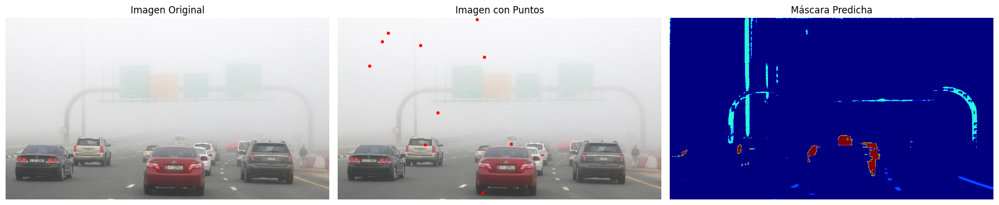

Procesando imágenes:   2%|▎         | 1/40 [00:07<04:48,  7.41s/it]

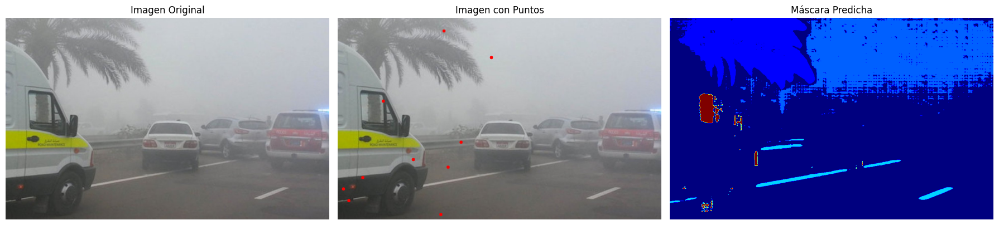

Procesando imágenes:   5%|▌         | 2/40 [00:15<04:52,  7.69s/it]

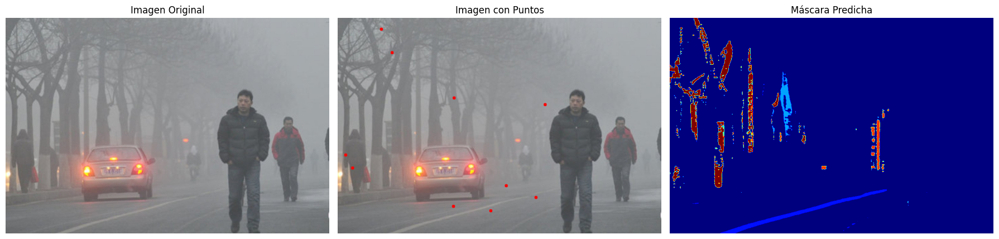

Procesando imágenes:   8%|▊         | 3/40 [00:23<04:52,  7.90s/it]

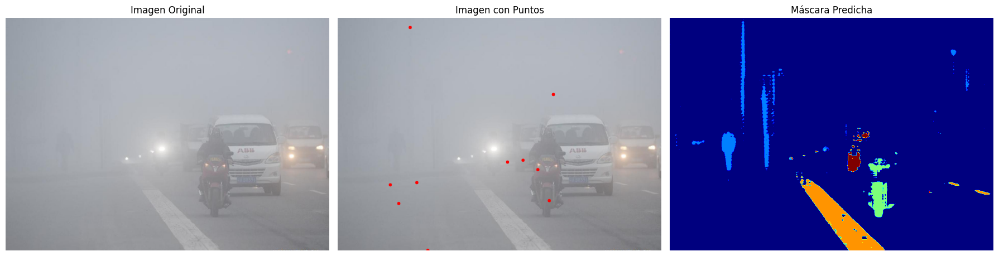

Procesando imágenes:  10%|█         | 4/40 [00:31<04:49,  8.05s/it]

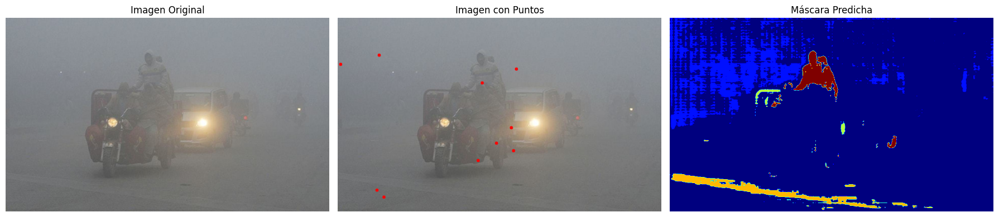

Procesando imágenes:  12%|█▎        | 5/40 [00:40<04:44,  8.14s/it]

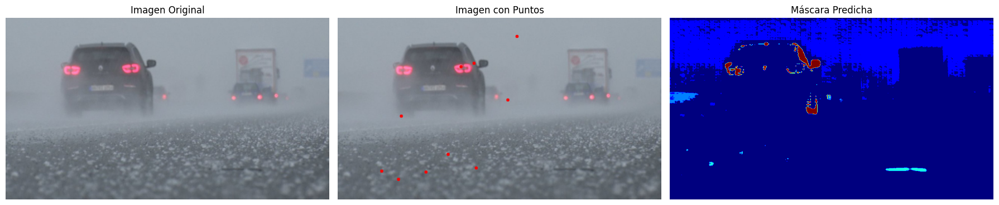

Procesando imágenes:  15%|█▌        | 6/40 [00:48<04:37,  8.16s/it]

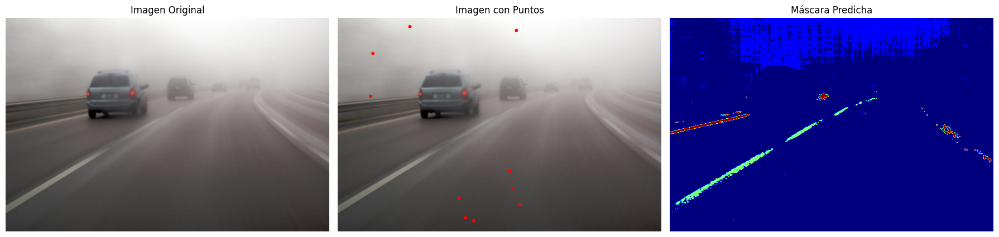

Procesando imágenes:  18%|█▊        | 7/40 [00:56<04:31,  8.22s/it]

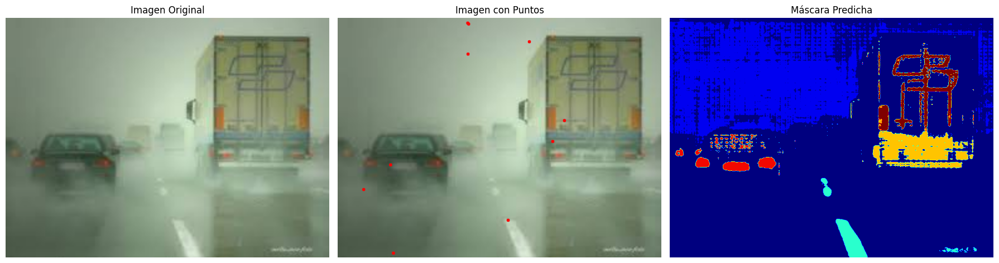

Procesando imágenes:  20%|██        | 8/40 [01:04<04:18,  8.08s/it]

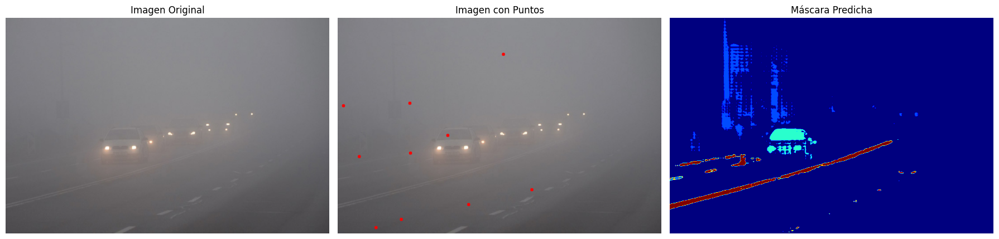

Procesando imágenes:  22%|██▎       | 9/40 [01:12<04:11,  8.11s/it]

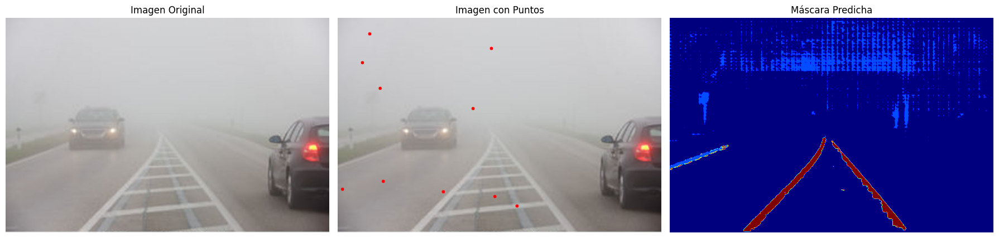

Procesando imágenes:  25%|██▌       | 10/40 [01:21<04:06,  8.23s/it]

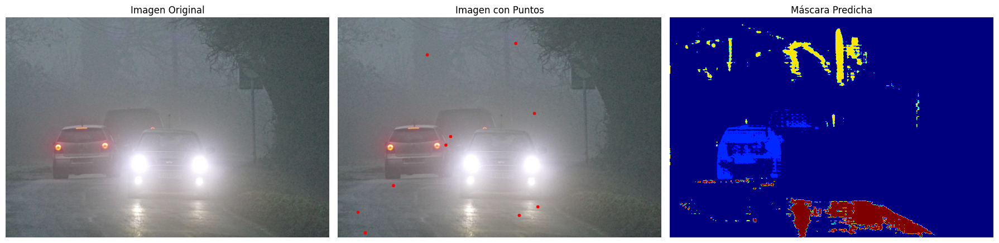

Procesando imágenes:  28%|██▊       | 11/40 [01:29<04:03,  8.40s/it]

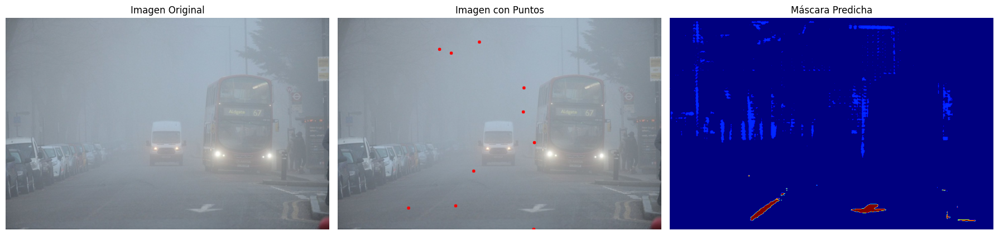

Procesando imágenes:  30%|███       | 12/40 [01:37<03:50,  8.25s/it]

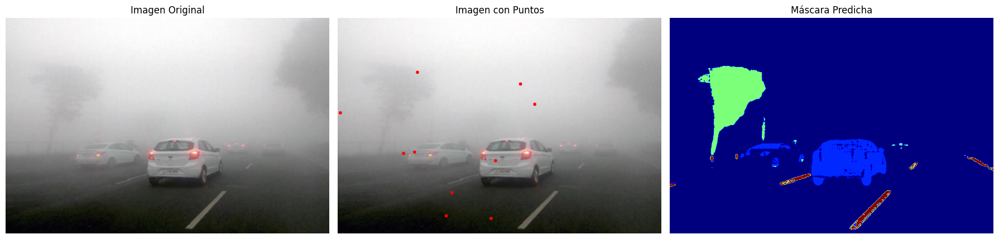

Procesando imágenes:  32%|███▎      | 13/40 [01:46<03:46,  8.39s/it]

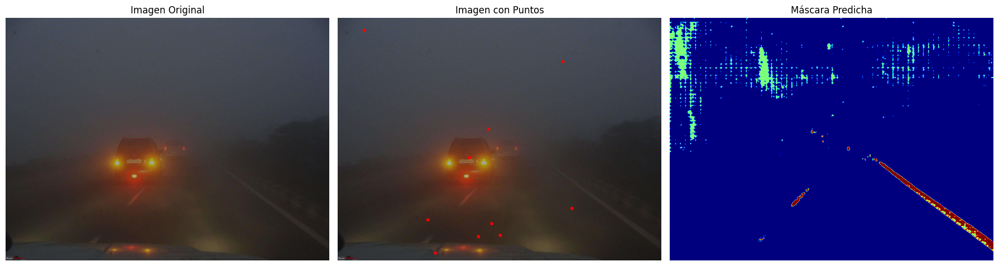

Procesando imágenes:  35%|███▌      | 14/40 [01:54<03:36,  8.31s/it]

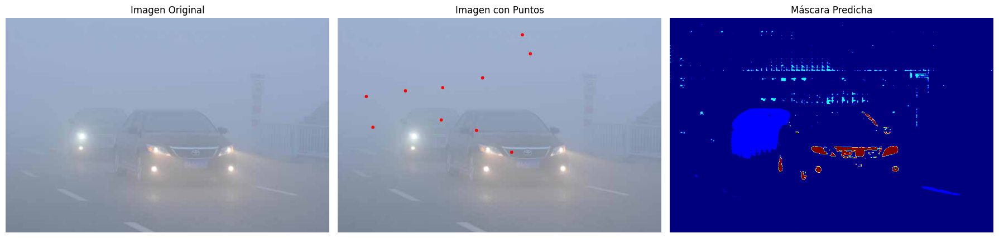

Procesando imágenes:  38%|███▊      | 15/40 [02:03<03:30,  8.42s/it]

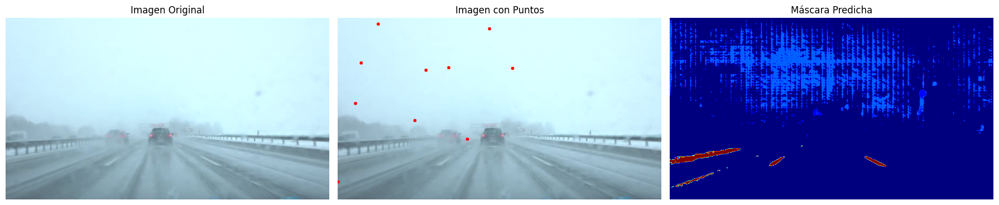

Procesando imágenes:  40%|████      | 16/40 [02:10<03:17,  8.22s/it]

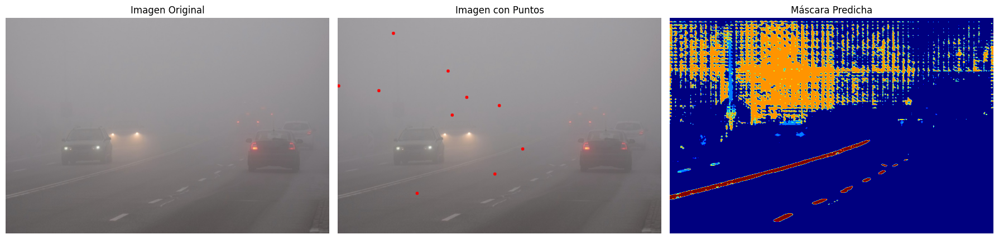

Procesando imágenes:  42%|████▎     | 17/40 [02:19<03:09,  8.25s/it]

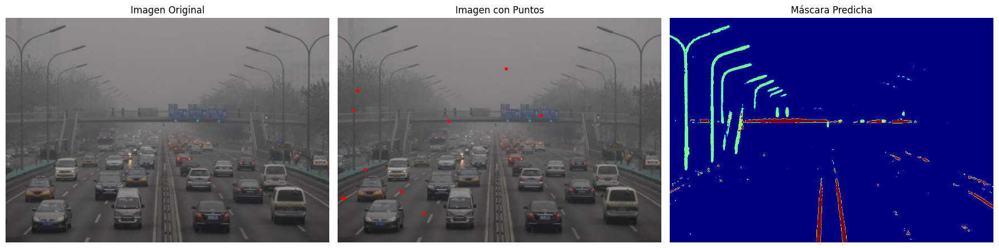

Procesando imágenes:  45%|████▌     | 18/40 [02:27<02:58,  8.12s/it]

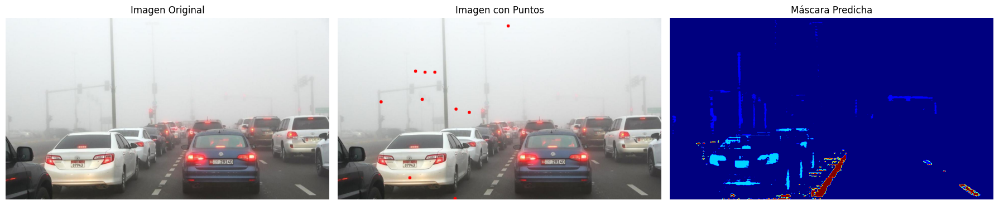

Procesando imágenes:  48%|████▊     | 19/40 [02:35<02:50,  8.13s/it]

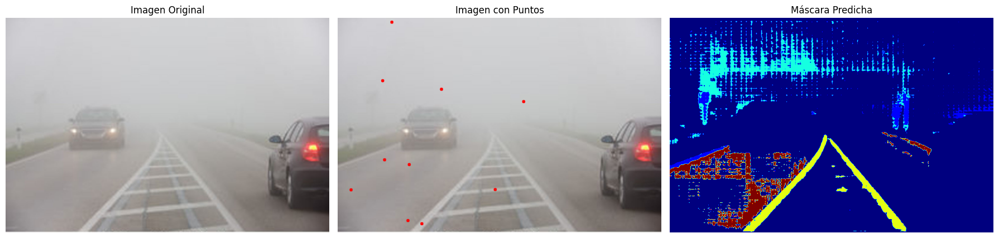

Procesando imágenes:  50%|█████     | 20/40 [02:42<02:38,  7.95s/it]

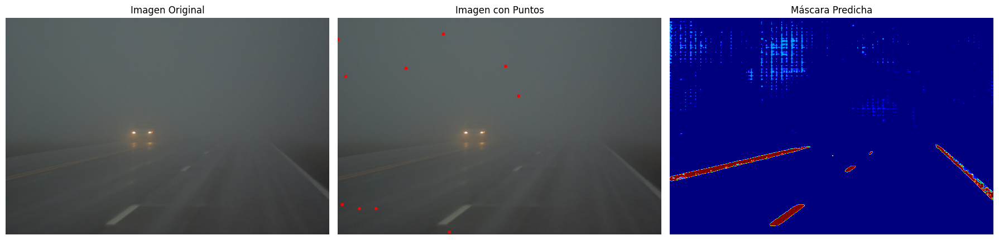

Procesando imágenes:  52%|█████▎    | 21/40 [02:51<02:36,  8.21s/it]

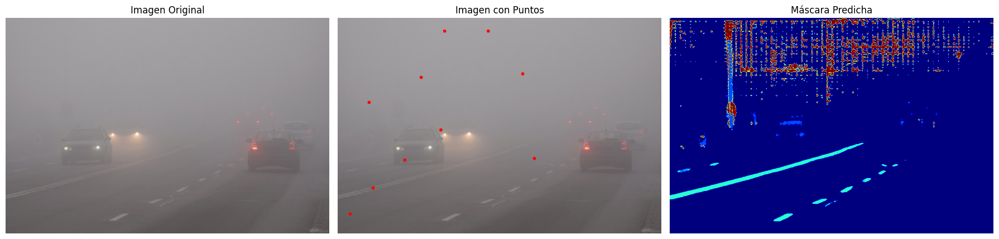

Procesando imágenes:  55%|█████▌    | 22/40 [02:59<02:27,  8.20s/it]

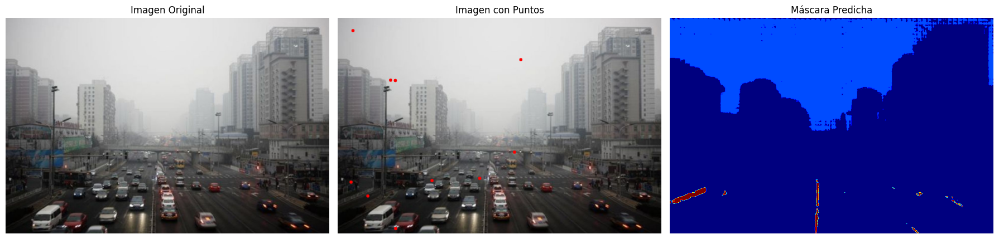

Procesando imágenes:  57%|█████▊    | 23/40 [03:07<02:18,  8.17s/it]

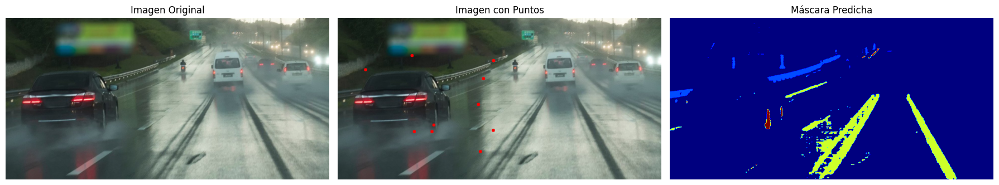

Procesando imágenes:  60%|██████    | 24/40 [03:15<02:06,  7.92s/it]

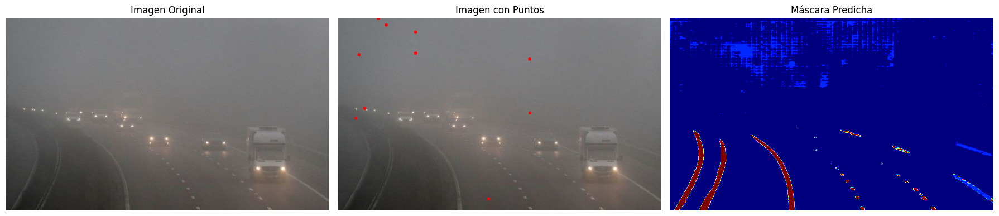

Procesando imágenes:  62%|██████▎   | 25/40 [03:23<02:00,  8.03s/it]

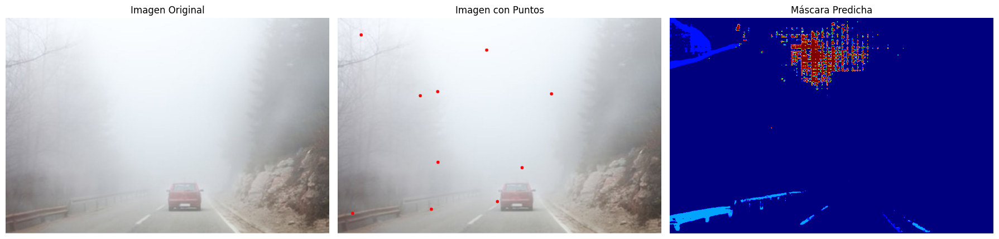

Procesando imágenes:  65%|██████▌   | 26/40 [03:30<01:50,  7.86s/it]

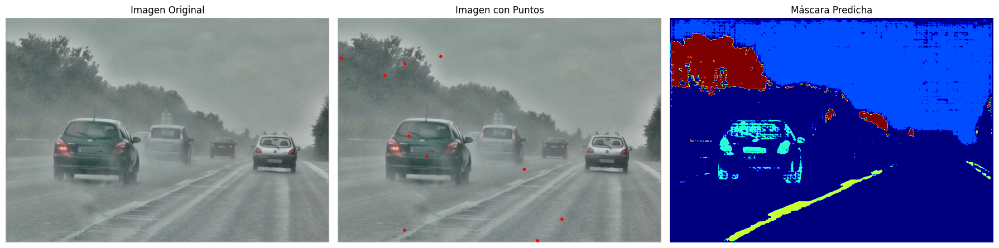

Procesando imágenes:  68%|██████▊   | 27/40 [03:39<01:44,  8.02s/it]

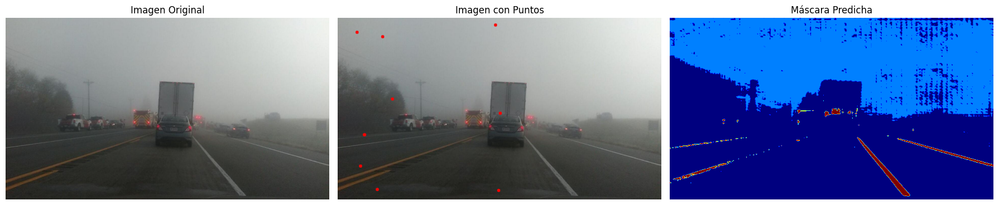

Procesando imágenes:  70%|███████   | 28/40 [03:46<01:33,  7.77s/it]

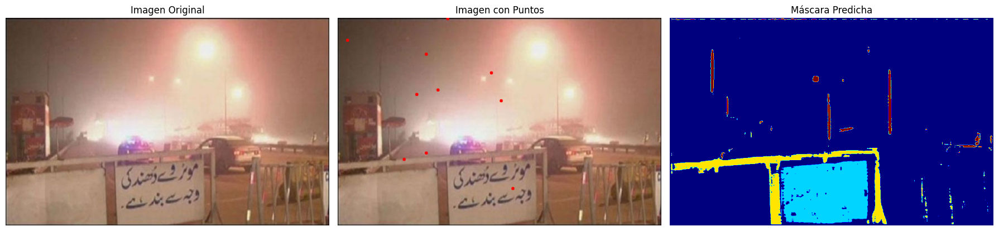

Procesando imágenes:  72%|███████▎  | 29/40 [03:54<01:26,  7.90s/it]

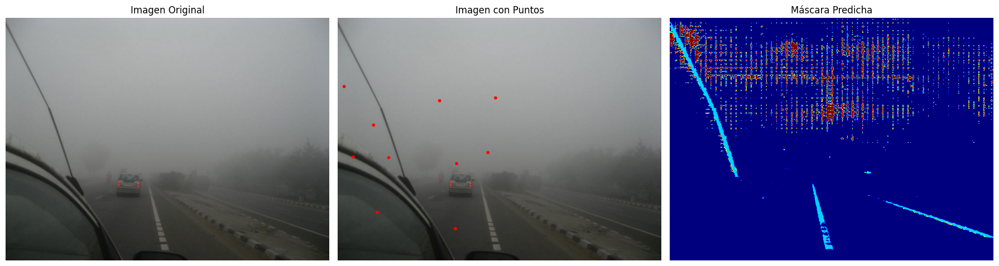

Procesando imágenes:  75%|███████▌  | 30/40 [04:03<01:20,  8.09s/it]

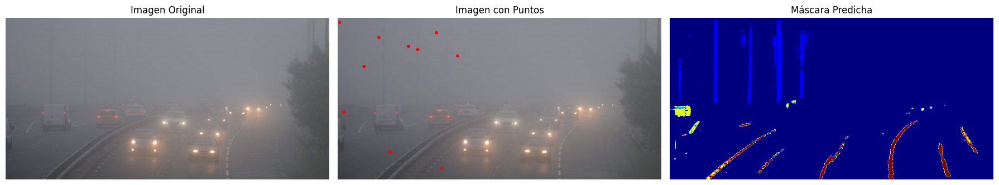

Procesando imágenes:  78%|███████▊  | 31/40 [04:12<01:16,  8.45s/it]

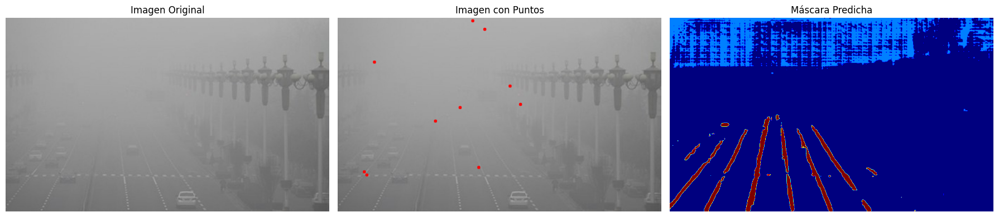

Procesando imágenes:  80%|████████  | 32/40 [04:21<01:08,  8.54s/it]

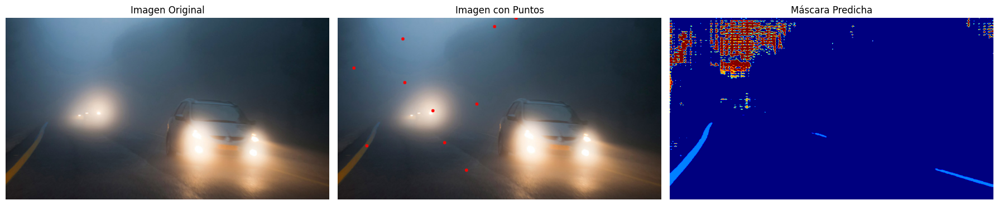

Procesando imágenes:  82%|████████▎ | 33/40 [04:30<01:00,  8.61s/it]

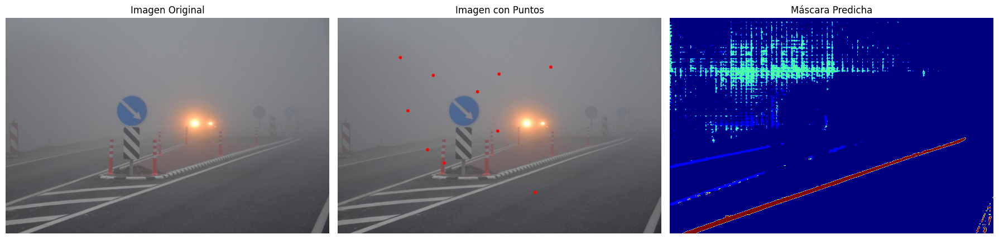

Procesando imágenes:  85%|████████▌ | 34/40 [04:38<00:50,  8.47s/it]

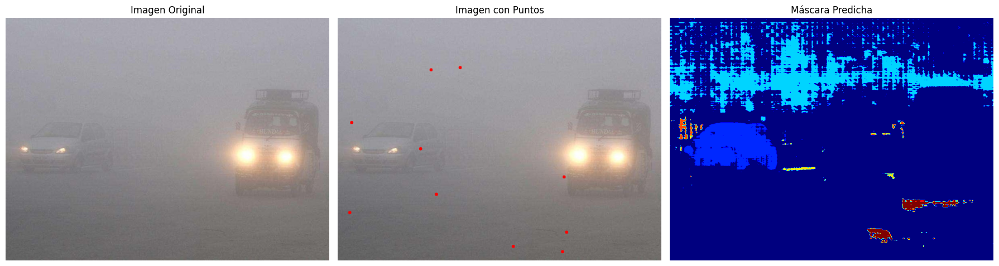

Procesando imágenes:  88%|████████▊ | 35/40 [04:46<00:41,  8.35s/it]

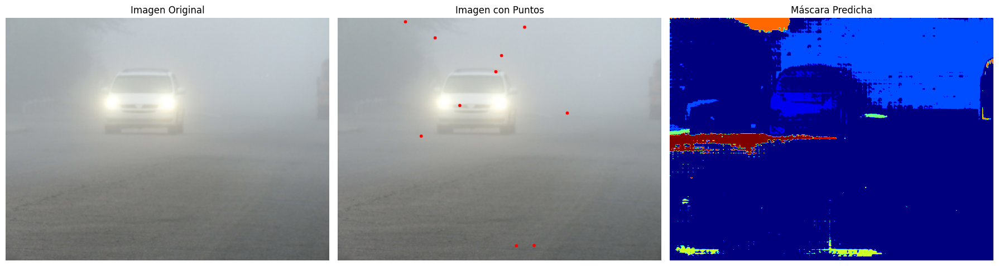

Procesando imágenes:  90%|█████████ | 36/40 [04:54<00:33,  8.28s/it]

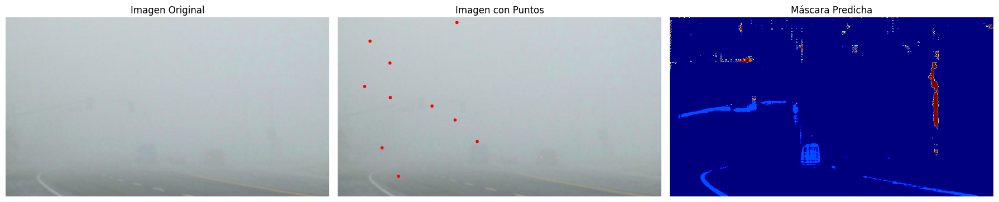

Procesando imágenes:  92%|█████████▎| 37/40 [05:02<00:24,  8.19s/it]

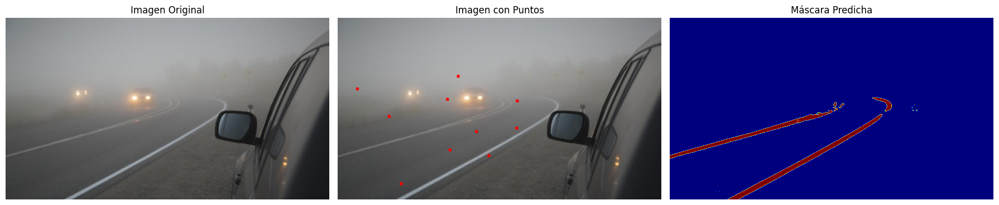

Procesando imágenes:  95%|█████████▌| 38/40 [05:11<00:16,  8.33s/it]

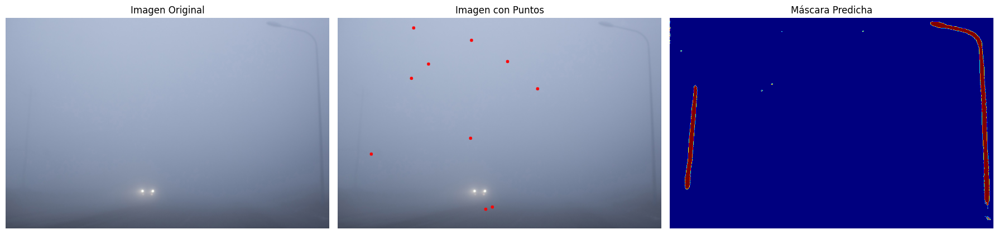

Procesando imágenes:  98%|█████████▊| 39/40 [05:18<00:08,  8.12s/it]

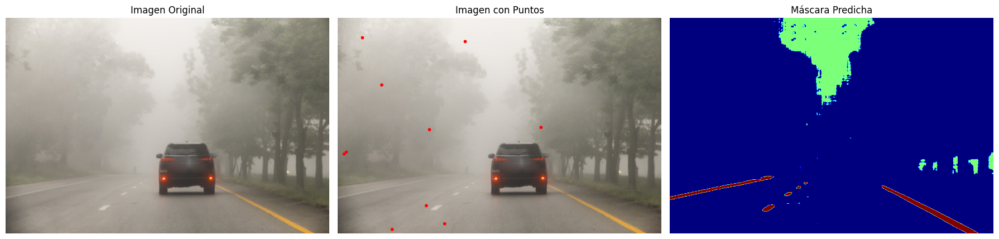

Procesando imágenes: 100%|██████████| 40/40 [05:26<00:00,  8.16s/it]


In [12]:
import os
import random
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm  # Para mostrar progreso
import cv2

# Umbral mínimo de área para considerar máscaras
MIN_AREA_THRESHOLD = 1000

# Ruta de la carpeta de imágenes de prueba
test_images_dir = "..."

# Listar todas las imágenes en la carpeta
image_files = sorted([os.path.join(test_images_dir, f) for f in os.listdir(test_images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Cargar el modelo afinado sin usar CUDA, solo con CPU
FINE_TUNED_MODEL_WEIGHTS = "fine_tuned_sam2_lanes.torch"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device="cpu")  # Cambié 'cuda' por 'cpu'

# Construir el predictor y cargar los pesos del modelo
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load(FINE_TUNED_MODEL_WEIGHTS, map_location=torch.device('cpu')))  # Asegúrate de que se cargue en la CPU

# Seleccionar aleatoriamente 40 imágenes del conjunto de prueba
random.seed(42)  # Para resultados reproducibles
selected_images = random.sample(image_files, min(40, len(image_files)))

# Procesar las imágenes seleccionadas
for img_path in tqdm(selected_images, desc="Procesando imágenes"):
    # Leer la imagen
    image = cv2.imread(img_path)[..., ::-1]  # Convertir de BGR a RGB

    # Redimensionar la imagen para el modelo
    r = np.min([1024 / image.shape[1], 1024 / image.shape[0]])
    image = cv2.resize(image, (int(image.shape[1] * r), int(image.shape[0] * r)))

    # Generar puntos de entrada aleatorios
    num_samples = 10  # Número de puntos
    h, w, _ = image.shape
    input_points = np.random.randint(0, min(h, w), size=(num_samples, 2))  # Coordenadas aleatorias
    input_labels = np.ones((num_samples, 1))  # Todas las etiquetas son 1

    # Realizar inferencia y predecir máscaras
    with torch.no_grad():
        predictor.set_image(image)
        masks, scores, logits = predictor.predict(
            point_coords=input_points[:, np.newaxis, :],  # Ajuste de forma para el modelo
            point_labels=input_labels
        )

    # Procesar las máscaras predichas
    np_masks = np.array(masks[:, 0])
    np_scores = scores[:, 0]
    sorted_masks = np_masks[np.argsort(np_scores)][::-1]

    # Filtrar las máscaras basadas en el área
    filtered_masks = []
    for mask in sorted_masks:
        area = np.sum(mask)  # Calcular el área de la máscara
        if area > MIN_AREA_THRESHOLD:
            filtered_masks.append(mask)
    filtered_masks = np.array(filtered_masks)

    # Inicializar el mapa de segmentación
    seg_map = np.zeros_like(sorted_masks[0], dtype=np.uint8)
    occupancy_mask = np.zeros_like(sorted_masks[0], dtype=bool)

    # Combinar máscaras
    for i, mask in enumerate(filtered_masks): 
        if (mask * occupancy_mask).sum() / mask.sum() > 0.15:
            continue

        mask_bool = mask.astype(bool)
        mask_bool[occupancy_mask] = False
        seg_map[mask_bool] = i + 1
        occupancy_mask[mask_bool] = True

    # Dibujar los puntos seleccionados en la imagen original
    image_with_points = image.copy()
    for point in input_points:
        cv2.circle(image_with_points, (point[0], point[1]), radius=5, color=(255, 0, 0), thickness=-1)  # Puntos en rojo

    # Visualización: Mostrar la imagen con puntos y la segmentación predicha
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title('Imagen Original')
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Imagen con Puntos')
    plt.imshow(image_with_points)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Máscara Predicha')
    plt.imshow(seg_map, cmap='jet')
    plt.axis('off')

    plt.tight_layout()
    plt.show()